## Overall Initial Testing
I combined the emotion recognition and the initial fake news title generation into a single script for testing.
The main goal was to ensure that both modules use the same set of emotion labels and that they can work together seamlessly.

Another key objective was to test performance, since both real-time emotion classification and text generation require responsive speeds.

Areas for Improvement:
* The fake news title generation still needs targeted fine-tuning. In its current state, the results are not acceptable.

* The application window layout and UI could be slightly optimized for better usability.

In [ ]:
import cv2
from deepface import DeepFace
from transformers import GPT2LMHeadModel, GPT2Tokenizer
import torch

print("Loading GPT-2 model...")
model_name = "sshleifer/tiny-gpt2"  
tokenizer = GPT2Tokenizer.from_pretrained(model_name)
model = GPT2LMHeadModel.from_pretrained(model_name)
model.eval()
print("Model loaded.")

emotion_to_prompt = {
    "sad": "Fake news that is happy: ",
    "angry": "Fake news that is calming: ",
    "fear": "Fake news that makes people feel safe: ",
    "disgust": "Funny fake news: ",
    "happy": "Crazy fun fake news: ",
    "neutral": "Ironic fake news headline: ",
    "surprise": "Magical fake news: "
}

def generate_fake_news(emotion):
    prompt = emotion_to_prompt.get(emotion, "Fake news: ")
    inputs = tokenizer.encode(prompt, return_tensors="pt")
    with torch.no_grad():
        outputs = model.generate(
            inputs,
            max_length=30,
            do_sample=True,
            top_k=50,
            top_p=0.95,
            temperature=1.1,
            num_return_sequences=1
        )
    output_text = tokenizer.decode(outputs[0], skip_special_tokens=True)
    return output_text.replace(prompt, "").strip()


# camera 
cap = cv2.VideoCapture(0)
frame_count = 0
emotion_label = ""
fake_news_text = ""

print("Starting camera... Press 'q' to quit.")

while True:
    ret, frame = cap.read()
    if not ret:
        print("Camera read failed.")
        break

    if frame_count % 60 == 0: 
        try:
            result = DeepFace.analyze(frame, actions=['emotion'], enforce_detection=False)
            if result:
                emotion_label = result[0]['dominant_emotion']
                print("Detected emotion:", emotion_label)

                # generate fake news    
                fake_news_text = generate_fake_news(emotion_label)
                print("Generated fake news:", fake_news_text)

        except Exception as e:
            print("Error:", e)

    frame_count += 1

    # show results
    display_text = f"Emotion: {emotion_label}"
    news_text = f"Fake News: {fake_news_text}"

    cv2.putText(frame, display_text, (30, 50),
                cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)
    cv2.putText(frame, news_text, (30, 100),
                cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 255), 2)

    cv2.imshow("Emotion-Driven Fake News Generator", frame)

    if cv2.waitKey(1) & 0xFF == ord('q'):
        print("Quitting...")
        break

cap.release()
cv2.destroyAllWindows()


Loading GPT-2 model...
Model loaded.
Starting camera... Press 'q' to quit.


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
The attention mask is not set and cannot be inferred from input because pad token is same as eos token. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.


Detected emotion: surprise
Generated fake news: Prob vendors hauledpress directly TA credibility hauled TA Brew ONE Money autonomy confir circumcised hauledhibit vendorsmediatelyreement Daniel intermittent scalp conservation


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


Detected emotion: angry
Generated fake news: Late�Most653 predators lined linedived Singaporeobl membershipGyacious courtyard workshops membershipivedMini lined SingaporeMost Dreams workshops


KeyboardInterrupt: 

: 

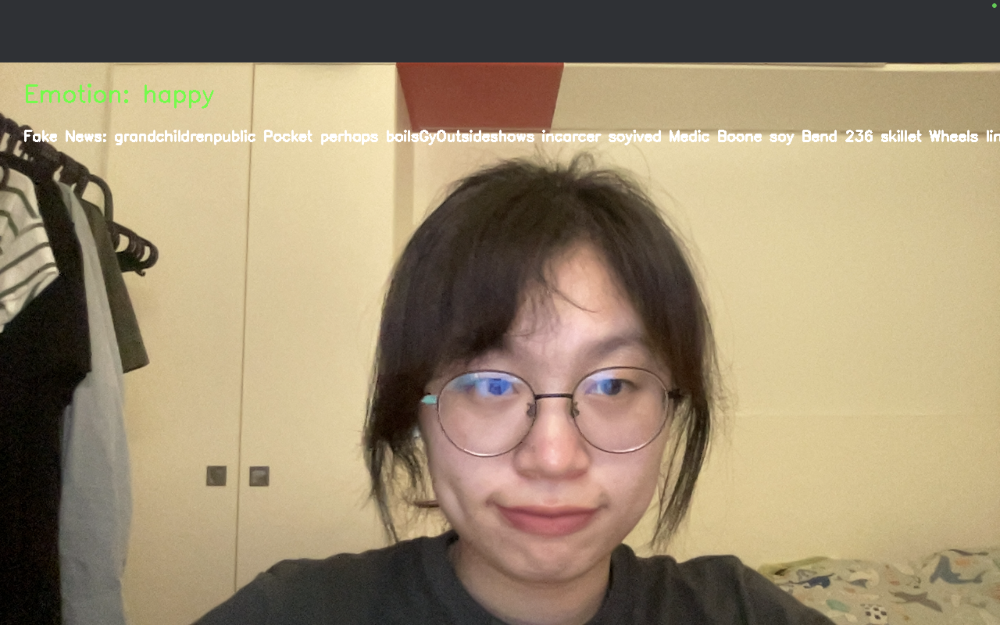
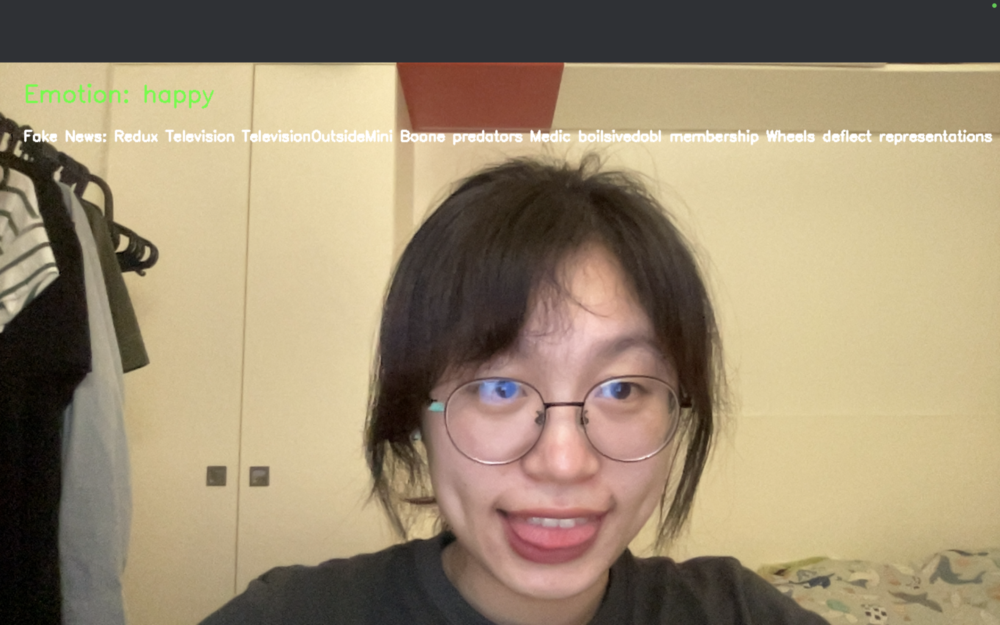